In [65]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

salary_by_gender = pd.read_csv("Data/salary_by_gender.csv")
female_salary = pd.read_csv("Data/female_salary.csv")
male_salary = pd.read_csv("Data/male_salary.csv")
full_table = pd.read_csv("Data/full_table.csv")



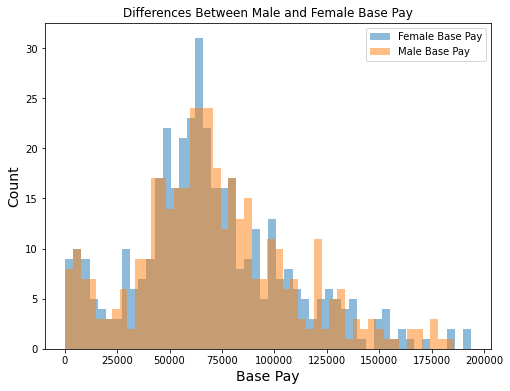

In [66]:
plt.figure(figsize=(8,6))
plt.hist(salary_by_gender['FemaleBasePay'], bins=50, alpha=0.5, label="Female Base Pay")
plt.hist(salary_by_gender['MaleBasePay'], bins=50, alpha=0.5, label="Male Base Pay")

plt.xlabel("Base Pay", size=14)
plt.ylabel("Count", size=14)
plt.title("Differences Between Male and Female Base Pay")
plt.legend(loc='upper right')

/opt/anaconda3/envs/myenv/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/envs/myenv/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


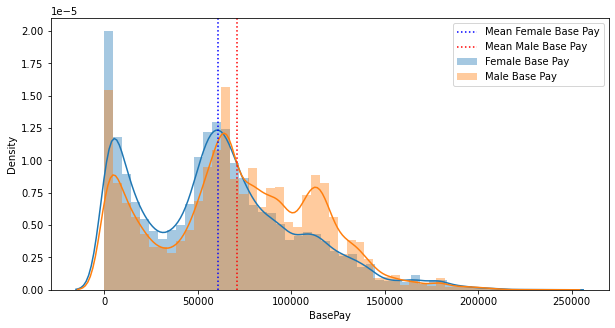

In [67]:
plt.figure(figsize=(10, 5))
sns.distplot(female_salary['BasePay'], label = 'Female Base Pay')
sns.distplot(male_salary['BasePay'], label = 'Male Base Pay')
plt.axvline(female_salary['BasePay'].mean(), color = 'blue', ls = ':', label = 'Mean Female Base Pay')
plt.axvline(male_salary['BasePay'].mean(), color = 'red', ls = ':', label = 'Mean Male Base Pay')
plt.legend(loc='upper right')
plt.show()

/opt/anaconda3/envs/myenv/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


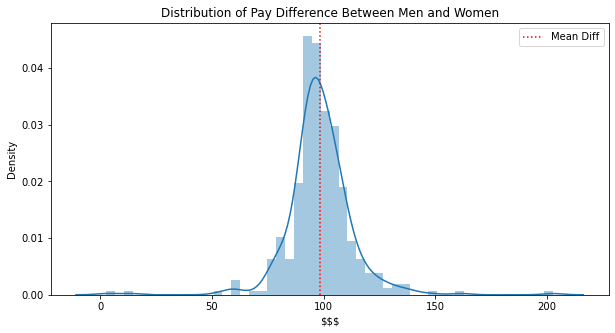

In [68]:

plt.figure(figsize=(10, 5))

sns.distplot(salary_by_gender['TotalPayProp'])
plt.title("Distribution of Pay Difference Between Men and Women")
plt.xlabel("$$$")
plt.ylabel("Density") 
plt.axvline(salary_by_gender['TotalPayProp'].mean(), color = 'red', ls = ':', label = 'Mean Diff')
plt.legend(loc='upper right')

plt.show()


In [74]:

print('The mean proportion of female base salary to male base salary is: ', salary_by_gender['BasePayProp'].mean())
print('For every $100 a man makes, a woman working the same job makes $99.38')
print(" ")
print('The mean proportion of female total salary to male total salary is: ', salary_by_gender['TotalPayProp'].mean())

The mean proportion of female base salary to male base salary is:  99.3845229476466
For every $100 a man makes, a woman working the same job makes $99.38
 
The mean proportion of female total salary to male total salary is:  98.37956014666081


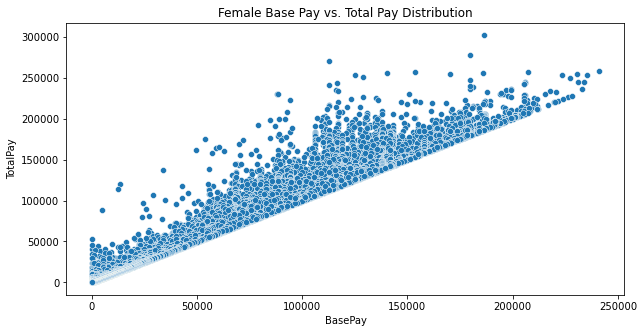

In [75]:
plt.figure(figsize = (10,5))
sns.scatterplot(data=female_salary, x="BasePay", y="TotalPay")
plt.title("Female Base Pay vs. Total Pay Distribution")
plt.show()

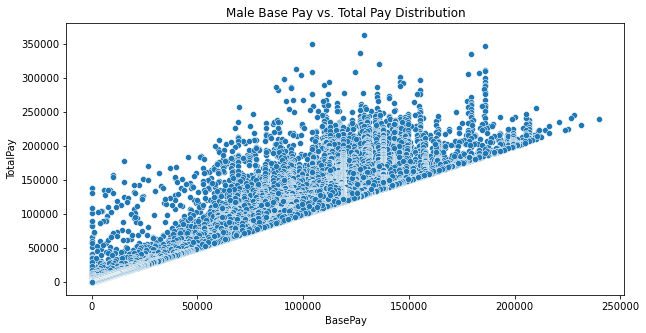

In [76]:
plt.figure(figsize = (10,5))
sns.scatterplot(data =male_salary, x= "BasePay", y = "TotalPay")
plt.title("Male Base Pay vs. Total Pay Distribution")
plt.show()

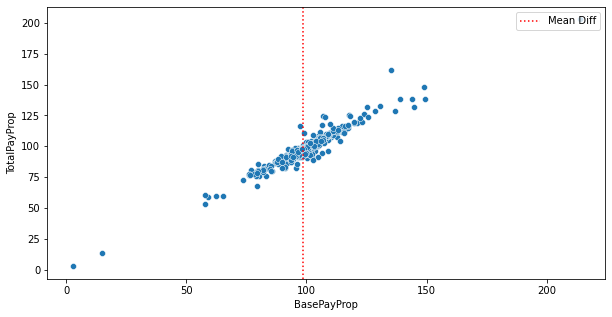

In [72]:
plt.figure(figsize = (10,5))
sns.scatterplot(data =salary_by_gender, x = "BasePayProp", y = "TotalPayProp")
plt.axvline(salary_by_gender['TotalPayProp'].mean(), color = 'red', ls = ':', label = 'Mean Diff')
plt.legend(loc='upper right')
plt.show()

In [73]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

salary_ols = smf.ols('TotalPay ~ Gender', data = full_table).fit()
salary_ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               TotalPay   R-squared:                       0.030
Model:                            OLS   Adj. R-squared:                  0.030
Method:                 Least Squares   F-statistic:                     3107.
Date:                Wed, 19 May 2021   Prob (F-statistic):               0.00
Time:                        17:08:40   Log-Likelihood:            -1.2188e+06
No. Observations:               99472   AIC:                         2.438e+06
Df Residuals:                   99470   BIC:                         2.438e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   6.567e+04    247.216    265.642      0.000    6.52e+04    6.62e+04
Gender      1.814e+04    325.401     55.743      0.000    1.75e+04    1.88e+04
==============================================================================
Omnibus:                     2932.747   Durbin-Watson:                   0.068
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3157.594
Skew:                           0.429   Prob(JB):                         0.00
Kurtosis:                       2.838   Cond. No.                         2.84
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""